# Web Scrape, Analyze and send custom emails on COVID-19

## Author: AKHIL JAMES

## 1. Import libraries

In [88]:
from bs4 import BeautifulSoup
import requests
import datetime
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import smtplib
from email.mime.text import MIMEText
from email.mime.multipart import MIMEMultipart
from email.mime.base import MIMEBase
from email import encoders

## 2. Webscraping

### 2.a. Fetch data from the webpage

In [89]:
URL = 'https://worldometers.info/coronavirus/'

headers = {"User-Agent": 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/77.0.3865.120 Safari/537.36'}
page=requests.get(URL, headers=headers)
soup=BeautifulSoup(page.content, 'html.parser')

### 2.b. Arrange the data into a list

In [90]:
covid19_data = []   #initiate empty list to store data

web_table = soup.find('table', {'id': 'main_table_countries_today'})  #look for the table in web page

table_rows = web_table.find_all('tr')   #find rows

#iterate through rows and append contents of each row to the list
for tr in table_rows:
    td = tr.find_all('td')
    row = [i.text for i in td]
    covid19_data.append(row)

covid19_data = covid19_data [1:] #remove blank/duplicate first row

## 3. Data wrangling

### 3.a. Convert the data into a pandas dataframe

In [91]:
#convert data into a pandas data frame and insert headers
df = pd.DataFrame(covid19_data)
df = df.iloc[:, 1:13] #remove first column with index and get data from the rest 12 columns
df.columns = ['Country/Other', 'Total_Cases', 'New_Cases', 'Total_Deaths', 'New_Deaths', 
              'Total_Recovered', 'Active_Cases', 'Serious/Critical', 'Cases_per_1M', 
              'Deaths_per_1M', 'Total_Tests', 'Test_per_1M']


df.replace('', 0, inplace=True)  #replace all empty string with 0 
df.replace(' ', 0, inplace=True) #replace  strings with just space with 0 
df.replace(np.nan, 0, inplace=True) #replace  nan with 0
df.replace('N/A', 0, inplace=True) #replace  'N/A' with 0

#drop data about continents
values_to_drop = ['North America', 'South America', 'Asia', 'Africa', 'Oceania', 'Total', 'Europe', 'World', '\n\n']

for drop_value in range (len(values_to_drop)):
    df = df[~df['Country/Other'].str.contains(str(values_to_drop[drop_value]))]

df

,Country/Other,Total_Cases,New_Cases,Total_Deaths,New_Deaths,Total_Recovered,Active_Cases,Serious/Critical,Cases_per_1M,Deaths_per_1M,Total_Tests,Test_per_1M
8,USA,"106,219,716",0,"1,155,069",0,"103,989,275",0,"1,075,372","1,982","317,258","3,450","1,173,802,429"
9,India,"44,718,781",0,"530,876",0,"44,171,551",0,"16,354",0,"31,791",377,"921,533,008"
10,France,"39,791,800",0,"165,678",0,"39,485,694",0,"140,428",869,"606,726","2,526","271,490,188"
11,Germany,"38,354,626",0,"170,964",0,"38,079,800","+1,500","103,862",0,"457,236","2,038","122,332,384"
12,Brazil,"37,258,663",0,"700,239",0,"36,249,161",0,"309,263",0,"173,012","3,252","63,776,166"
...,...,...,...,...,...,...,...,...,...,...,...,...
234,Vatican City,29,0,0,0,29,0,0,0,"36,295",0,0
235,Western Sahara,10,0,1,0,9,0,0,0,16,2,0
236,MS Zaandam,9,0,2,0,7,0,0,0,0,0,0
237,Tokelau,5,0,0,0,0,0,5,0,"3,628",0,0


In [92]:
# Get data from totals row. #Not used in plotting

tag = soup.find(class_="total_row_body")

total_rows = tag.find_all('td')

total_row = [i.text for i in total_rows]
total_row = total_row[1:13]
print(total_row)

['Total:', '683,978,215', '+31,997', '6,831,873', '+113', '656,919,159', '+44,595', '20,227,183', '39,911', '87,748.0', '876.5', '']


In [93]:
df = df.drop(columns=['Total_Tests', 'Test_per_1M']) #dropping last two column as it is not used later

df.head()

,Country/Other,Total_Cases,New_Cases,Total_Deaths,New_Deaths,Total_Recovered,Active_Cases,Serious/Critical,Cases_per_1M,Deaths_per_1M
8,USA,"106,219,716",0,"1,155,069",0,"103,989,275",0,"1,075,372","1,982","317,258"
9,India,"44,718,781",0,"530,876",0,"44,171,551",0,"16,354",0,"31,791"
10,France,"39,791,800",0,"165,678",0,"39,485,694",0,"140,428",869,"606,726"
11,Germany,"38,354,626",0,"170,964",0,"38,079,800","+1,500","103,862",0,"457,236"
12,Brazil,"37,258,663",0,"700,239",0,"36,249,161",0,"309,263",0,"173,012"


### 3.b. Convert the datatypes of the columns from object to float

In [94]:
columns_to_convert = list(df.columns)[1:] #list of columns whose datatype should be changed

for column in columns_to_convert:
    df[column] = df[column].str.replace(',','').astype(np.float64)
    
#sort countries with most cases
df=df.sort_values(by=['Total_Cases'], ascending = False)
df.head()

,Country/Other,Total_Cases,New_Cases,Total_Deaths,New_Deaths,Total_Recovered,Active_Cases,Serious/Critical,Cases_per_1M,Deaths_per_1M
8,USA,106219716.0,NaN,1155069.0,NaN,103989275.0,NaN,1075372.0,1982.0,317258.0
9,India,44718781.0,NaN,530876.0,NaN,44171551.0,NaN,16354.0,NaN,31791.0
10,France,39791800.0,NaN,165678.0,NaN,39485694.0,NaN,140428.0,869.0,606726.0
11,Germany,38354626.0,NaN,170964.0,NaN,38079800.0,1500.0,103862.0,NaN,457236.0
12,Brazil,37258663.0,NaN,700239.0,NaN,36249161.0,NaN,309263.0,NaN,173012.0


### 3.c. Extract part of the dataframe to make plots

In [95]:
df1 = df[0:9] #take top 9 countries for plotting
df2 = df[9:] #to make a new category called 'others' to be used in plotting

others = df2.sum(axis = 0, skipna = True)

others['Country/Other']='Others'

others['Cases_per_1M']=others['Cases_per_1M']/len(df2) #average the value
others['Deaths_per_1M']=others['Deaths_per_1M']/len(df2) #average the value


df1 = df1.append(others, ignore_index=True) #append all other countries ('others') to df1


df3=df1[['Country/Other','Total_Cases','Active_Cases','Total_Deaths']] #data in pie chart , used for inserting table in plot


## 4. Plot the data

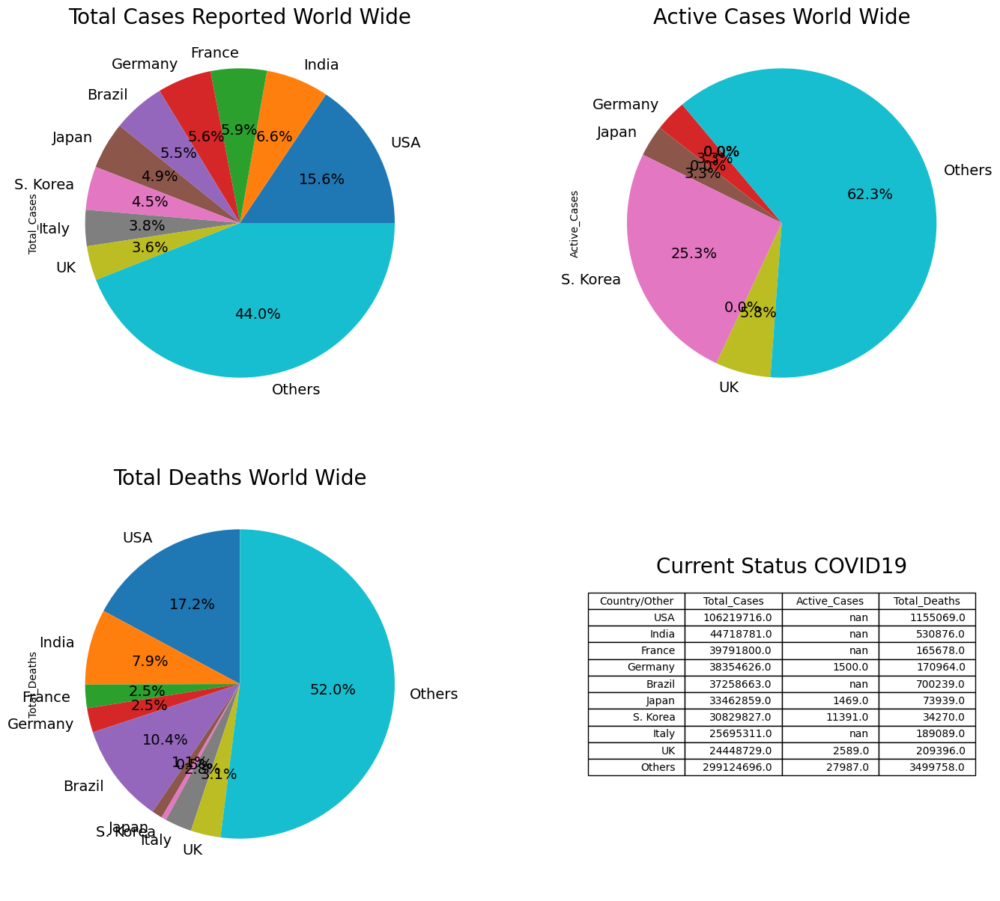

In [96]:
#plot pie charts

plt.figure(figsize=(16,12))

ax1 = plt.subplot(221, aspect='equal')
df1.plot(kind='pie', y = 'Total_Cases', ax=ax1, autopct='%1.1f%%', 
 startangle=0, shadow=False, labels=df1['Country/Other'], legend = False, fontsize=14)
plt.title('Total Cases Reported World Wide',fontsize=20)

ax2 = plt.subplot(222, aspect='equal')
df1.plot(kind='pie', y = 'Active_Cases', ax=ax2, autopct='%1.1f%%', 
 startangle=130, shadow=False, labels=df1['Country/Other'], legend = False, fontsize=14)
plt.title('Active Cases World Wide',fontsize=20)

ax3 = plt.subplot(223, aspect='equal')
df1.plot(kind='pie', y = 'Total_Deaths', ax=ax3, autopct='%1.1f%%', 
 startangle=90, shadow=False, labels=df1['Country/Other'], legend = False, fontsize=14)
plt.title('Total Deaths World Wide',fontsize=20)

#insert table in the plot
df3_text = []
for df3_row in range(len(df3)):
    df3_text.append(df3.iloc[df3_row])
plt.subplot(224)
plt.table(cellText=df3_text, colLabels=df3.columns, loc='center')
plt.axis('off')
plt.title('Current Status COVID19',fontsize=20, y=0.75)

#adjust allignment of subplots
plt.subplots_adjust(top = 0.99, bottom=0.01, hspace=0.1, wspace=0.4)
plt.savefig('COVID19_distribution.png', dpi=300)
plt.show()


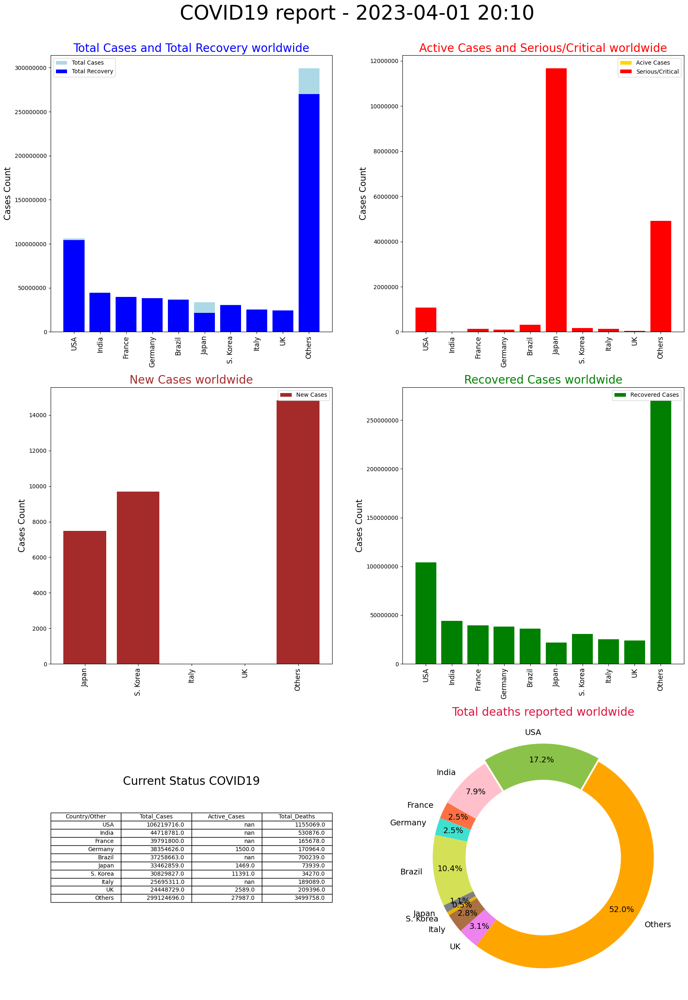

In [97]:
plt.figure(figsize=(20,25))

#plot Total Cases and Total Recovered worldwide in bar plots
ax2 = plt.subplot(321)
country = df1['Country/Other']
tot_cases = df1['Total_Cases']
tot_deaths = df1['Total_Recovered']
ax2.bar(country, tot_cases, color='lightblue')
ax2.bar(country, tot_deaths, color='blue')
ax2.set_ylabel('Cases Count', fontsize=15)
ax2.set_title('Total Cases and Total Recovery worldwide',fontsize=20, color='Blue')
ax2.set_xticklabels(country, rotation=90, fontsize=12)
ax2.legend(["Total Cases", "Total Recovery"])
ax2.ticklabel_format(style='plain', axis='y')


#plot Active Cases and Serious/Critical worldwide in bar plots
ax3 = plt.subplot(322)
country = df1['Country/Other']
act_cases = df1['Active_Cases']
critical = df1['Serious/Critical']
ax3.bar(country, act_cases, color='gold')
ax3.bar(country, critical, color='red')
ax3.set_ylabel('Cases Count', fontsize=15)
ax3.set_title('Active Cases and Serious/Critical worldwide',fontsize=20, color='red')
ax3.set_xticklabels(country, rotation=90, fontsize=12)
ax3.legend(["Acive Cases", "Serious/Critical"])
ax3.ticklabel_format(style='plain', axis='y')


#plot new cases worldwide in bar plots
ax5 = plt.subplot(323)
country = df1['Country/Other']
new_cases = df1['New_Cases']
ax5.bar(country, new_cases, color='brown')
ax5.set_ylabel('Cases Count', fontsize=15)
ax5.set_title('New Cases worldwide',fontsize=20, color='Brown')
ax5.set_xticklabels(country, rotation=90, fontsize=12)
ax5.legend(["New Cases"])
ax5.ticklabel_format(style='plain', axis='y')


#plot Total recovered worldwide in bar plots
ax4 = plt.subplot(324)
country = df1['Country/Other']
rec_cases = df1['Total_Recovered']
ax4.bar(country, rec_cases, color='green')
ax4.set_ylabel('Cases Count', fontsize=15)
ax4.set_title('Recovered Cases worldwide',fontsize=20, color='Green')
ax4.set_xticklabels(country, rotation=90, fontsize=12)
ax4.legend(["Recovered Cases"])
ax4.ticklabel_format(style='plain', axis='y')


#Insert a table into the plot
df3_text = []
for df3_row in range(len(df3)):
    df3_text.append(df3.iloc[df3_row])
plt.subplot(325)
plt.table(cellText=df3_text, colLabels=df3.columns, loc='center')
plt.axis('off')
plt.title('Current Status COVID19',fontsize=20, y=0.75)


#Plot Total deaths world wide as a donut plot
ax1 = plt.subplot(326)
values = df1['Total_Deaths']
labels = df1['Country/Other'].unique()
total = np.sum(values)
colors = ['#8BC34A','Pink','#FE7043','Turquoise','#D4E157','Grey','#EAB300','#AA7043','Violet','Orange']
ax1.pie (values , labels= labels , colors= colors , 
         startangle=60 , autopct='%1.1f%%', pctdistance=0.85, 
         explode=[0.03,0,0,0,0,0,0,0,0,0], textprops={'fontsize': 14} )
my_circle=plt.Circle( (0,0), 0.7, color='white') # Adding circle at the centre
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.title('Total deaths reported worldwide',fontsize=20, color='crimson')

right_now = str(datetime.datetime.now().strftime("%Y-%m-%d %H:%M"))

#adjust allignment of plots and save
plt.subplots_adjust(top = 0.93, bottom=0.01, hspace=0.2, wspace=0.25)
plt.suptitle('COVID19 report - '+right_now, fontsize=35) #main title of plot
plt.savefig('COVID19_update.png', dpi=500)
plt.show()


## 5. Classification Models


### 5.1 Data Preprocessing

In [98]:
# import lab
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, f1_score, r2_score, accuracy_score, \
    precision_score
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
# import dataset
df = pd.read_csv("Covid Data.csv")
df.tail()

,USMER,MEDICAL_UNIT,SEX,PATIENT_TYPE,DATE_DIED,INTUBED,PNEUMONIA,AGE,PREGNANT,DIABETES,...,ASTHMA,INMSUPR,HIPERTENSION,OTHER_DISEASE,CARDIOVASCULAR,OBESITY,RENAL_CHRONIC,TOBACCO,CLASIFFICATION_FINAL,ICU
1048570,2,13,2,1,9999-99-99,97,2,40,97,2,...,2,2,2,2,2,2,2,2,7,97
1048571,1,13,2,2,9999-99-99,2,2,51,97,2,...,2,2,1,2,2,2,2,2,7,2
1048572,2,13,2,1,9999-99-99,97,2,55,97,2,...,2,2,2,2,2,2,2,2,7,97
1048573,2,13,2,1,9999-99-99,97,2,28,97,2,...,2,2,2,2,2,2,2,2,7,97
1048574,2,13,2,1,9999-99-99,97,2,52,97,2,...,2,2,2,2,2,2,2,2,7,97


In [99]:
df.info


<bound method DataFrame.info of          USMER  MEDICAL_UNIT  SEX  PATIENT_TYPE   DATE_DIED  INTUBED  \
0            2             1    1             1  03/05/2020       97   
1            2             1    2             1  03/06/2020       97   
2            2             1    2             2  09/06/2020        1   
3            2             1    1             1  12/06/2020       97   
4            2             1    2             1  21/06/2020       97   
...        ...           ...  ...           ...         ...      ...   
1048570      2            13    2             1  9999-99-99       97   
1048571      1            13    2             2  9999-99-99        2   
1048572      2            13    2             1  9999-99-99       97   
1048573      2            13    2             1  9999-99-99       97   
1048574      2            13    2             1  9999-99-99       97   

         PNEUMONIA  AGE  PREGNANT  DIABETES  ...  ASTHMA  INMSUPR  \
0                1   65         2 

In [100]:
df.describe()


,USMER,MEDICAL_UNIT,SEX,PATIENT_TYPE,INTUBED,PNEUMONIA,AGE,PREGNANT,DIABETES,COPD,ASTHMA,INMSUPR,HIPERTENSION,OTHER_DISEASE,CARDIOVASCULAR,OBESITY,RENAL_CHRONIC,TOBACCO,CLASIFFICATION_FINAL,ICU
count,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06
mean,1.632194e+00,8.980565e+00,1.499259e+00,1.190765e+00,7.952288e+01,3.346831e+00,4.179410e+01,4.976558e+01,2.186404e+00,2.260569e+00,2.242626e+00,2.298132e+00,2.128989e+00,2.435143e+00,2.261810e+00,2.125176e+00,2.257180e+00,2.214333e+00,5.305653e+00,7.955397e+01
std,4.822084e-01,3.723278e+00,4.999997e-01,3.929041e-01,3.686889e+01,1.191288e+01,1.690739e+01,4.751073e+01,5.424242e+00,5.132258e+00,5.114089e+00,5.462843e+00,5.236397e+00,6.646676e+00,5.194850e+00,5.175445e+00,5.135354e+00,5.323097e+00,1.881165e+00,3.682307e+01
min,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
25%,1.000000e+00,4.000000e+00,1.000000e+00,1.000000e+00,9.700000e+01,2.000000e+00,3.000000e+01,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,3.000000e+00,9.700000e+01
50%,2.000000e+00,1.200000e+01,1.000000e+00,1.000000e+00,9.700000e+01,2.000000e+00,4.000000e+01,9.700000e+01,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,6.000000e+00,9.700000e+01
75%,2.000000e+00,1.200000e+01,2.000000e+00,1.000000e+00,9.700000e+01,2.000000e+00,5.300000e+01,9.700000e+01,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,7.000000e+00,9.700000e+01
max,2.000000e+00,1.300000e+01,2.000000e+00,2.000000e+00,9.900000e+01,9.900000e+01,1.210000e+02,9.800000e+01,9.800000e+01,9.800000e+01,9.800000e+01,9.800000e+01,9.800000e+01,9.800000e+01,9.800000e+01,9.800000e+01,9.800000e+01,9.800000e+01,7.000000e+00,9.900000e+01


In [101]:
df.isnull().sum()


USMER                   0
MEDICAL_UNIT            0
SEX                     0
PATIENT_TYPE            0
DATE_DIED               0
INTUBED                 0
PNEUMONIA               0
AGE                     0
PREGNANT                0
DIABETES                0
COPD                    0
ASTHMA                  0
INMSUPR                 0
HIPERTENSION            0
OTHER_DISEASE           0
CARDIOVASCULAR          0
OBESITY                 0
RENAL_CHRONIC           0
TOBACCO                 0
CLASIFFICATION_FINAL    0
ICU                     0
dtype: int64

### 5.2 Data Visualization

In [102]:
df['DEAD'] = [2 if i=='9999-99-99' else 1 for i in df.DATE_DIED]
df.drop(columns=['DATE_DIED'], inplace=True)


<AxesSubplot: >

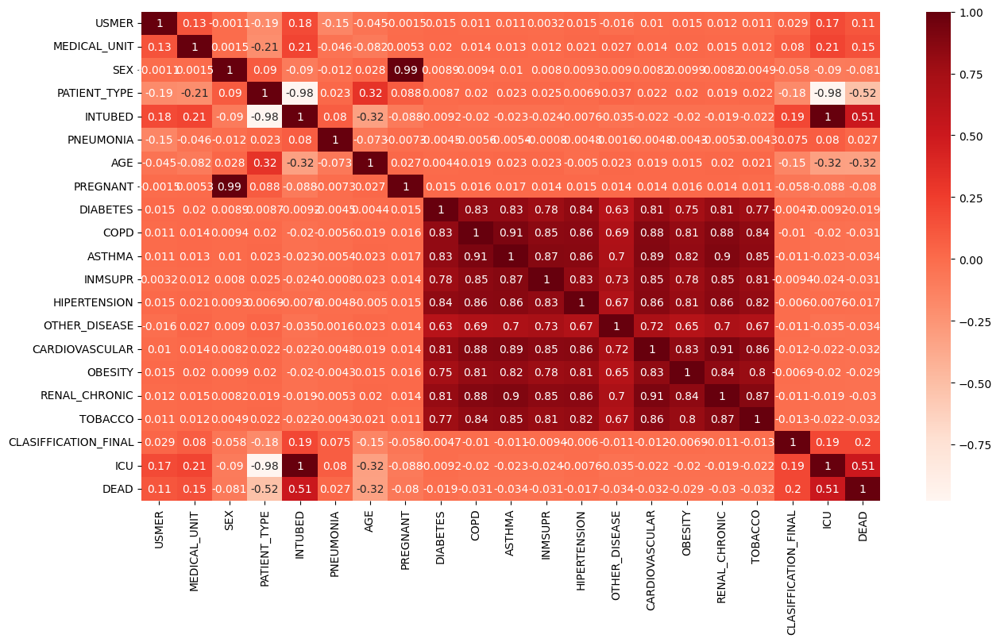

In [103]:
fig, ax = plt.subplots(figsize=(15, 8))
sns.heatmap(df.corr(), annot = True, cmap = "Reds")


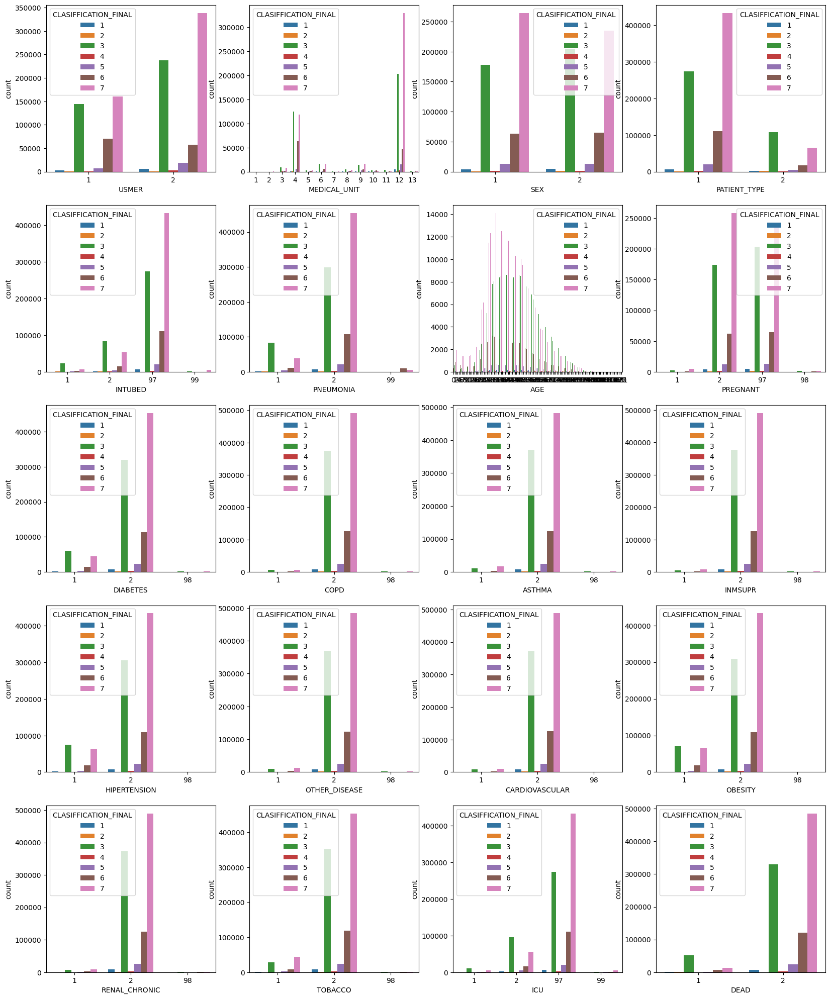

In [104]:
plt.figure(figsize=(20, 25))
index = 1
temp = df.drop("CLASIFFICATION_FINAL", axis = 1)

for i in temp.columns:
    plt.subplot(5, 4, index)
    sns.countplot(data=df, x=i, hue="CLASIFFICATION_FINAL")
    index += 1
plt.show()


<AxesSubplot: xlabel='AGE', ylabel='count'>

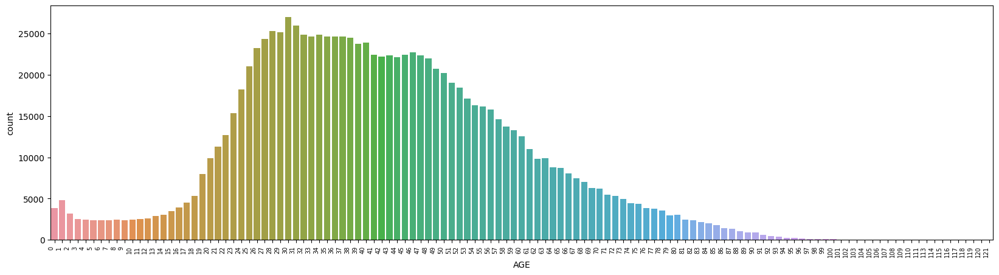

In [105]:
df.head()
plt.figure(figsize=(20,5))
plt.xticks(rotation=90, horizontalalignment='right',fontweight='light',fontsize='x-small' )
sns.countplot(x='AGE', data=df)

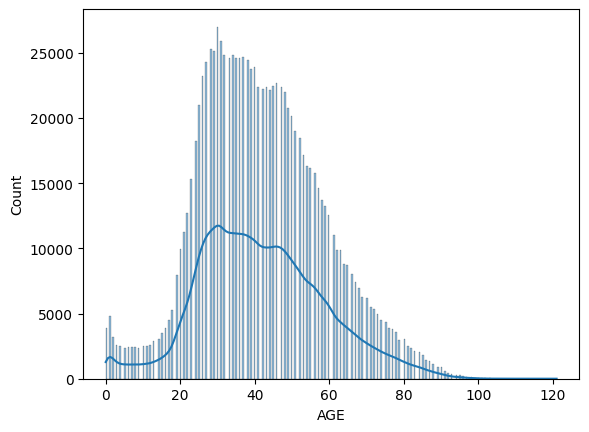

In [106]:
sns.histplot(x=df.AGE, kde = True)
plt.show()

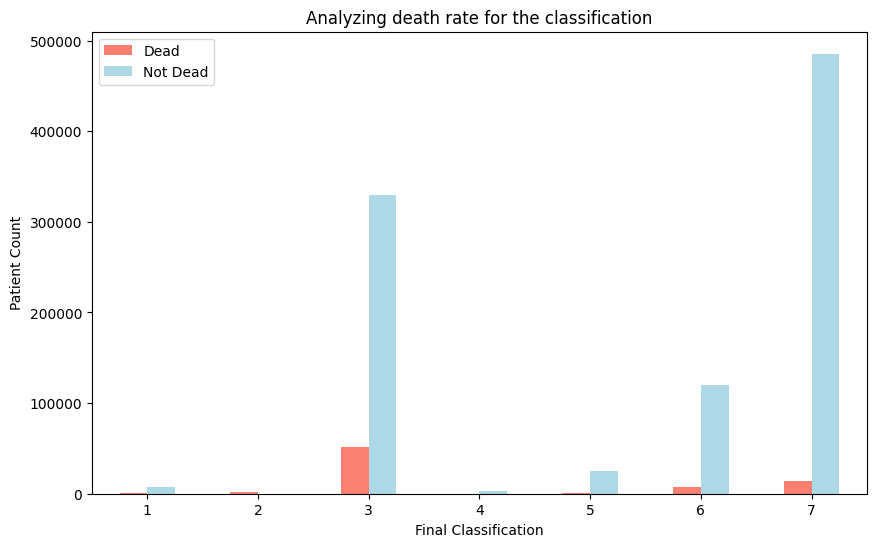

In [107]:
pd.crosstab(df.CLASIFFICATION_FINAL, df.DEAD).plot(kind="bar", figsize=(10,6), color=["salmon","lightblue"])
plt.title("Analyzing death rate for the classification")
plt.xlabel("Final Classification")
plt.ylabel("Patient Count")
plt.legend(["Dead", "Not Dead"])
plt.xticks(rotation=0);

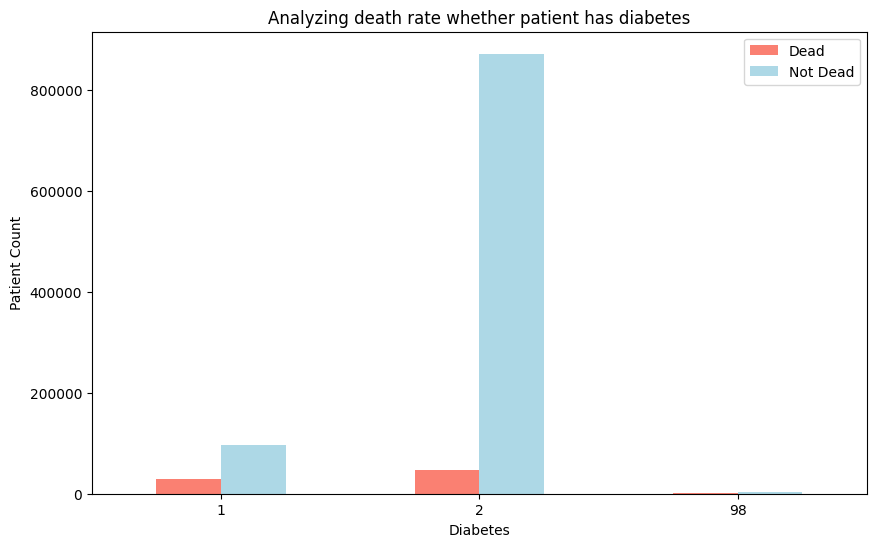

In [108]:
pd.crosstab(df.DIABETES, df.DEAD).plot(kind="bar", figsize=(10,6), color=["salmon","lightblue"])
plt.title("Analyzing death rate whether patient has diabetes")
plt.xlabel("Diabetes")
plt.ylabel("Patient Count")
plt.legend(["Dead", "Not Dead"])
plt.xticks(rotation=0);

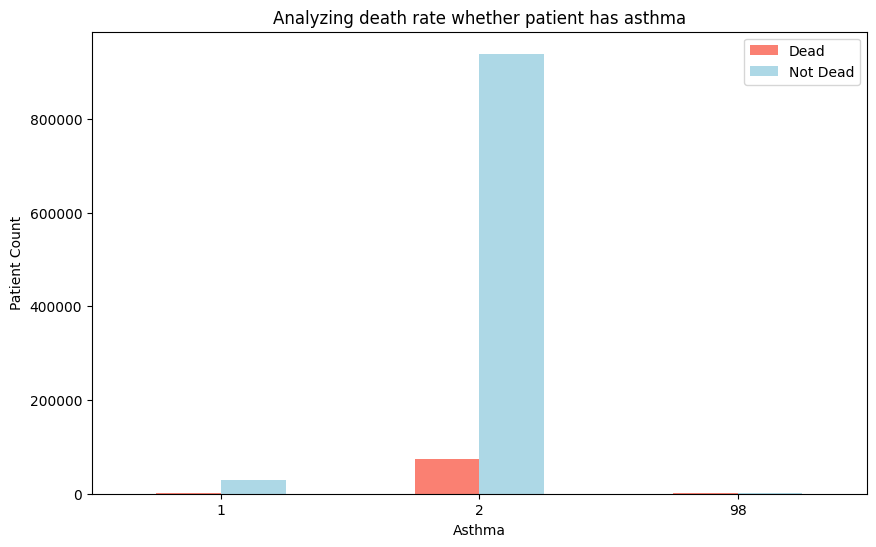

In [109]:
pd.crosstab(df.ASTHMA, df.DEAD).plot(kind="bar", figsize=(10,6), color=["salmon","lightblue"])
plt.title("Analyzing death rate whether patient has asthma")
plt.xlabel("Asthma")
plt.ylabel("Patient Count")
plt.legend(["Dead", "Not Dead"])
plt.xticks(rotation=0);

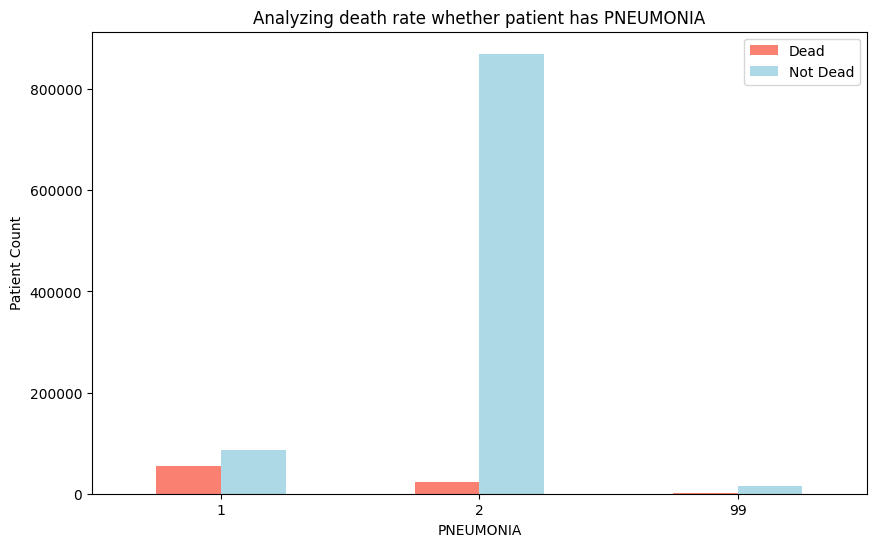

In [110]:
pd.crosstab(df.PNEUMONIA, df.DEAD).plot(kind="bar", figsize=(10,6), color=["salmon","lightblue"])
plt.title("Analyzing death rate whether patient has PNEUMONIA")
plt.xlabel("PNEUMONIA")
plt.ylabel("Patient Count")
plt.legend(["Dead", "Not Dead"])
plt.xticks(rotation=0);

### 5.3 Creating Models

#### 5.3.1 Logistic Regression

Logistic Regression Accuracy:  0.9361642607598236
Logistic Regression F1 Score:  [0.47361661 0.96602182]
Logistic Regression R2 Score:  0.049661789538723355


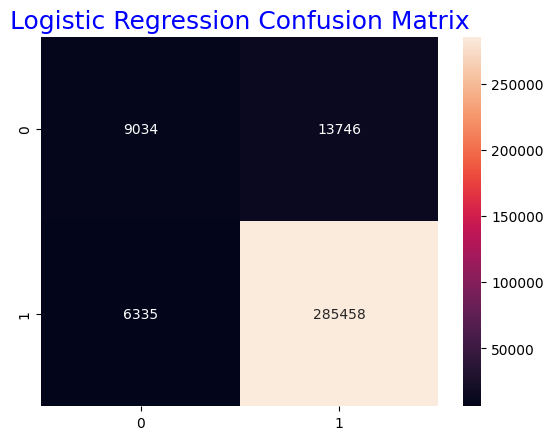

In [111]:
## split dataset into independent & dependant features
x =df.iloc[:,:-1]
y =df.iloc[:,-1]
### train test split
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(
    x, y, test_size=0.30, random_state=42)
lr = LogisticRegression()
lr.fit(x_train,y_train)
print("Logistic Regression Accuracy: ",lr.score(x_test,y_test))
print("Logistic Regression F1 Score: ",f1_score(y_test,lr.predict(x_test),average=None))
print("Logistic Regression R2 Score: ",r2_score(y_test,lr.predict(x_test)))
plt.figure()
sns.heatmap(confusion_matrix(y_test, lr.predict(x_test)), annot=True, fmt=".0f")
plt.title("Logistic Regression Confusion Matrix",fontsize=18, color="b")
plt.show()

#### 5.3.2 Decision Tree Classifier

Decision Tree Score:  0.9366665289137974
Decision Tree F1 Score:  [0.56117707 0.96587037]
Decision Tree R2 Score:  0.05713917797818757


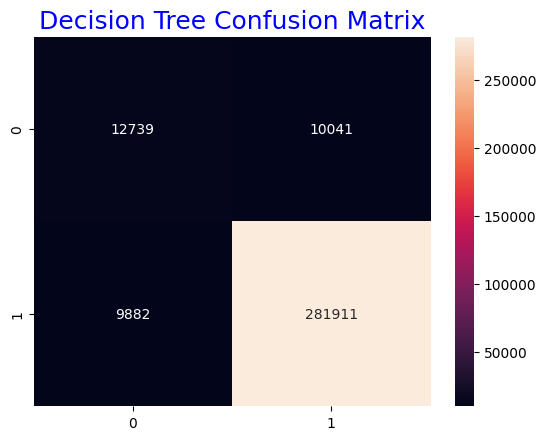

In [112]:
dt=DecisionTreeClassifier(random_state=42)
dt.fit(x_train,y_train)
print("Decision Tree Score: ",dt.score(x_test,y_test))
print("Decision Tree F1 Score: ",f1_score(y_test,dt.predict(x_test),average=None))
print("Decision Tree R2 Score: ",r2_score(y_test,dt.predict(x_test)))
plt.figure()
sns.heatmap(confusion_matrix(y_test, dt.predict(x_test)), annot=True, fmt=".0f")
plt.title("Decision Tree Confusion Matrix",fontsize=18, color="b")
plt.show()

#### 5.3.3 Random Forest Classifier

Random Forest Score:  0.9404367189809678
Random Forest F1 Score:  [0.58128673 0.96793789]
Random Forest R2 Score:  0.11326691651745724


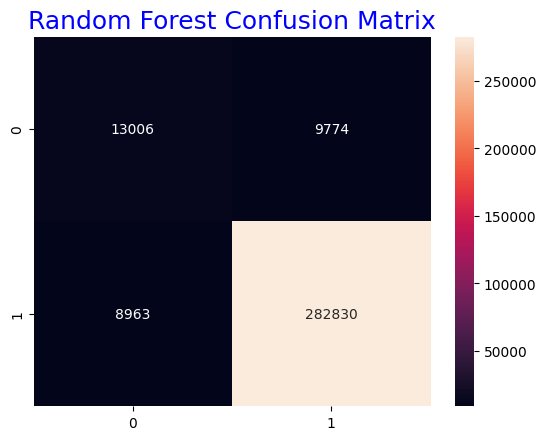

In [113]:
rf=RandomForestClassifier(n_estimators=4,random_state=42)
rf.fit(x_train,y_train)
print("Random Forest Score: ",rf.score(x_test,y_test))
print("Random Forest F1 Score: ",f1_score(y_test,rf.predict(x_test),average=None))
print("Random Forest R2 Score: ",r2_score(y_test,rf.predict(x_test)))
plt.figure()
sns.heatmap(confusion_matrix(y_test, rf.predict(x_test)), annot=True, fmt=".0f")
plt.title("Random Forest Confusion Matrix",fontsize=18, color="b")
plt.show()

## 6.Decrypting Machine Learning models using LIME

In [114]:
import lime
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train),
    feature_names=x_train.columns,
    class_names=['1', '0'],
    mode='classification'
)

In [115]:
exp = explainer.explain_instance(
    data_row=x_test.iloc[1], 
    predict_fn=lr.predict_proba
)

exp.show_in_notebook(show_table=True)

In [116]:
exp = explainer.explain_instance(
    data_row=x_test.iloc[1], 
    predict_fn=dt.predict_proba
)

exp.show_in_notebook(show_table=True)

In [117]:
exp = explainer.explain_instance(
    data_row=x_test.iloc[1], 
    predict_fn=rf.predict_proba
)

exp.show_in_notebook(show_table=True)

In [118]:

exp = explainer.explain_instance(
    data_row=x_test.iloc[3000], 
    predict_fn=lr.predict_proba
)

exp.show_in_notebook(show_table=True)

In [119]:
exp = explainer.explain_instance(
    data_row=x_test.iloc[3000], 
    predict_fn=dt.predict_proba
)

exp.show_in_notebook(show_table=True)

In [120]:
exp = explainer.explain_instance(
    data_row=x_test.iloc[3000], 
    predict_fn=rf.predict_proba
)

exp.show_in_notebook(show_table=True)